# TRABAJO PRÁCTICO INTEGRADOR N°1

## Sistema de Análisis de Documentos Digitalizados

---

**Información del Estudiante:**
- **Nombre y Apellido:** Daiana Elizabeth Gomez
- **Fecha de Entrega:** 24 de Septiembre de 2025
- **Materia:** Procesamiento de Imágenes - IFTS24

---

### Objetivo

Desarrollar un sistema básico de análisis automático de documentos digitalizados que integre las técnicas de procesamiento de imágenes estudiadas en el curso.

### Estructura del Trabajo

| Parte | Descripción | Peso |
|-------|-------------|------|
| **1** | Fundamentos Teóricos | 20% |
| **2** | Setup del Entorno | 15% |
| **3** | Análisis de Imágenes | 35% |
| **4** | Preprocessing Básico | 30% |

**Dataset requerido:** 3 imágenes de documentos con diferentes características (buena calidad, rotada, con problemas de iluminación)

---

# PARTE 1: Fundamentos Teóricos

## ¿Por qué Cuadernos Interactivos para IA y Ciencias de Datos?

### Diferencias Metodológicas Fundamentales

El trabajo en inteligencia artificial y ciencias de datos requiere un enfoque metodológico diferente al desarrollo de software tradicional. Mientras que la programación tradicional sigue un flujo lineal y predecible, el trabajo con datos es inherentemente iterativo y exploratorio.

**Programación Tradicional:**
```
Requisitos → Diseño → Implementación → Testing → Producto
```

**Investigación en IA/Datos:**
```
Hipótesis ⟷ Experimento ⟷ Análisis ⟷ Refinamiento ⟷ Nueva Hipótesis
```

### Ventajas de los Cuadernos Interactivos

1. **Narrativa Científica:** Permiten documentar el proceso de pensamiento, no solo el resultado final
2. **Iteración Rápida:** Ejecutar y modificar secciones específicas sin reejecutar todo el programa
3. **Visualización Inmediata:** Ver resultados inmediatamente después de cada paso
4. **Comunicación Efectiva:** Stakeholders no técnicos pueden seguir el proceso y entender decisiones
5. **Reproducibilidad:** Otros investigadores pueden replicar exactamente los experimentos

### Casos de Uso en la Industria

- **Google Research:** Publica papers con cuadernos que permiten reproducir experimentos
- **Netflix:** Usa cuadernos para análisis de datos de usuarios y recomendaciones
- **Uber:** Análisis de patrones de viajes y optimización de rutas
- **Kaggle:** Plataforma completa basada en cuadernos para competencias de machine learning

### Cuándo Usar Cada Herramienta

**Usar Cuadernos para:**
- Análisis exploratorio de datos
- Experimentación y prototipado
- Comunicación de resultados
- Educación y documentación

**Usar Scripts para:**
- Sistemas en producción
- Automatización de tareas repetitivas
- APIs y servicios web
- Pipelines de datos automatizados

En este trabajo práctico, usaremos cuadernos porque estamos en la fase de investigación y experimentación, donde necesitamos entender los datos, probar diferentes enfoques y documentar nuestros hallazgos.

---

# PARTE 2: Setup del Entorno

En esta sección vas a configurar tu entorno de trabajo de manera profesional. Un setup bien hecho te ahorra tiempo y errores durante todo el proyecto.

**Material de consulta:** `Utilidades_y_Plantillas.ipynb`

## 2.1 Importaciones Básicas

Importá las librerías necesarias para procesamiento de imágenes y visualización:

In [62]:
# ============================================
# 📦 Importaciones principales para el TP
# ============================================

# Procesamiento numérico
import numpy as np

# Visualización
import matplotlib.pyplot as plt

# Procesamiento de imágenes
import cv2
from PIL import Image
from skimage import color, measure
from skimage.filters import unsharp_mask
from skimage.morphology import disk, closing, opening, erosion, dilation

# Machine Learning (solo lo que usamos)
from sklearn.cluster import KMeans

# Colab (si trabajás en Google Colab)
from google.colab.patches import cv2_imshow

# Configuración global de matplotlib
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 10

# Semilla para reproducibilidad
np.random.seed(42)

print("✓ Importaciones cargadas correctamente")


✓ Importaciones cargadas correctamente


## 2.2 Funciones Utilitarias

Implementá una función básica para cargar y mostrar información de imágenes:

In [2]:
def cargar_imagen_segura(path, target_size=None):
    """
    Carga una imagen de forma segura con manejo completo de errores.
    Convierte automáticamente a RGB y normaliza valores entre 0-1.

    Args:
        path (str): Ruta completa al archivo de imagen
        target_size (tuple): Tupla (ancho, alto) para redimensionar la imagen

    Returns:
        numpy.ndarray: Array normalizado (0-1) o None si hay error

    Ejemplo:
        img = cargar_imagen_segura('foto.jpg', target_size=(256, 256))
    """
    try:
        # Abrir imagen usando PIL (soporta múltiples formatos)
        img = Image.open(path)

        # Convertir a RGB si está en otro modo (RGBA, L, etc.)
        # Esto garantiza consistencia en el número de canales
        if img.mode != 'RGB':
            img = img.convert('RGB')

        # Redimensionar si se especifica un tamaño objetivo
        # LANCZOS ofrece mejor calidad para redimensionamiento
        if target_size:
            img = img.resize(target_size, Image.Resampling.LANCZOS)

        # Convertir a numpy array y normalizar a rango [0,1]
        # División por 255 convierte de uint8 [0,255] a float [0,1]
        return np.array(img) / 255.0

    except Exception as e:
        # Capturar cualquier error (archivo no encontrado, formato no válido, etc.)
        print(f"Error cargando {path}: {e}")
        return None

    """
    Muestra información básica de la imagen: dimensiones, tipo, rango de valores.
    """
def mostrar_imagen_info(imagen, titulo="Imagen"):
    """
    Muestra información estadística completa de una imagen.
    Útil para debugging y análisis exploratorio.

    Args:
        imagen (numpy.ndarray): Array de la imagen
        titulo (str): Título descriptivo para la salida

    Ejemplo:
        mostrar_imagen_info(mi_imagen, "Imagen Original")
    """
    print(f"{titulo.upper()}:")
    print(f"   Shape: {imagen.shape}")                    # Dimensiones (altura, ancho, canales)
    print(f"   Tipo de datos: {imagen.dtype}")           # Tipo de datos (float64, uint8, etc.)
    print(f"   Rango de valores: [{imagen.min():.3f}, {imagen.max():.3f}]")  # Min y max
    print(f"   Valor promedio: {imagen.mean():.3f}")     # Media de todos los píxeles
    print(f"   Desviación estándar: {imagen.std():.3f}") # Variabilidad de los valores



## 2.3 Verificación del Setup

Probá que todo funciona creando una imagen sintética simple:

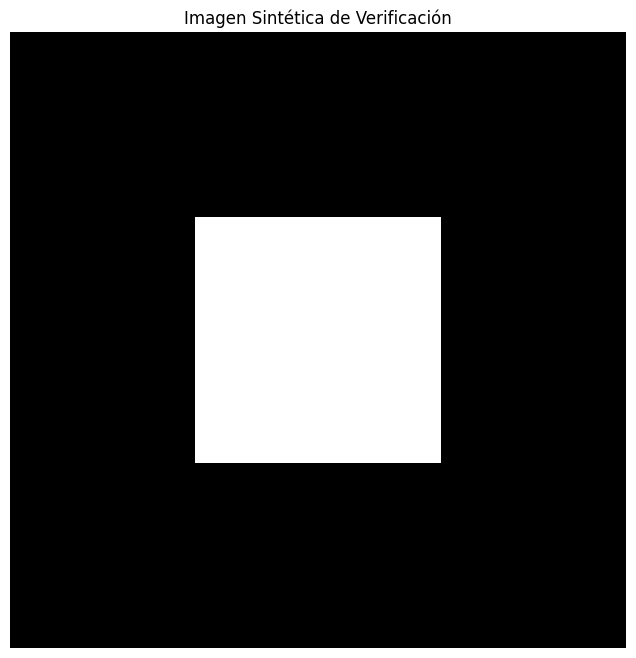

IMAGEN CARGADA CON FUNCION SEGURA:
   Shape: (100, 100, 3)
   Tipo de datos: float64
   Rango de valores: [0.000, 1.000]
   Valor promedio: 0.160
   Desviación estándar: 0.367


In [3]:
# Creá una imagen sintética simple (ej: gradiente o patrón)
# Probá tus funciones con esta imagen

# Crear una imagen sintética simple: un cuadrado blanco sobre fondo negro
altura, ancho = 100, 100  # tamaño de la imagen
imagen_Prueba = np.zeros((altura, ancho), dtype=np.uint8)  # fondo negro

# Dibujar un cuadrado blanco en el centro
imagen_Prueba[30:70, 30:70] = 255  # valor máximo para blanco

# Mostrar la imagen
plt.imshow(imagen_Prueba, cmap='gray')
plt.title("Imagen Sintética de Verificación")
plt.axis('off')
plt.show()

# Guarda la imagen
plt.imsave('/content/imagen_prueba.png', imagen_Prueba, cmap='gray')

# Test the cargar_imagen_segura function
imagen_cargada = cargar_imagen_segura(path='/content/imagen_prueba.png')
if imagen_cargada is not None:
    mostrar_imagen_info(imagen_cargada, "Imagen Cargada con Funcion Segura")

---

# PARTE 3: Análisis de Tu Dataset

Ahora vas a trabajar con tu dataset de 3 documentos. Esta parte es clave para entender qué problemas tenés que resolver.

**Preparación del Dataset:**
- Creá una carpeta llamada `dataset/` en la misma ubicación que este notebook
- Incluí exactamente 3 imágenes de documentos:
  1. Una de buena calidad (bien iluminada, recta)
  2. Una rotada o inclinada
  3. Una con problemas (oscura, borrosa, o con sombras)

## 3.1 Carga de las Imágenes

**Material de consulta:** `002/TEO/LeerImagenColor.ipynb`

In [63]:
# ============================================
# 📂 Carga de dataset (4 imágenes)
# ============================================

# Rutas a tus imágenes
rutas_imagenes = [
    "/content/dataset/Imagen_Buena.jpg",       # Imagen 1: buena calidad
    "/content/dataset/Imagen_Inclinada.webp",  # Imagen 2: celular inclinado
    "/content/dataset/imagen_borrosa.jpg",     # Imagen 3: borrosa
    "/content/dataset/auto_inclinado.jpg"      # Imagen 4: auto con sombras
]

# Nombres descriptivos
nombres = ["Buena Calidad", "Rotada", "Borrosa", "Sombras"]

# Cargar imágenes en una lista
imagenes = []
for i, ruta in enumerate(rutas_imagenes):
    img = cargar_imagen_segura(path=ruta)
    if img is not None:
        imagenes.append(img)
        print(f"✓ {nombres[i]} cargada correctamente: {img.shape}")
    else:
        print(f"⚠️ No se pudo cargar {nombres[i]}")



✓ Buena Calidad cargada correctamente: (1280, 853, 3)
✓ Rotada cargada correctamente: (766, 1200, 3)
✓ Borrosa cargada correctamente: (853, 1280, 3)
✓ Sombras cargada correctamente: (858, 1280, 3)


## 3.2 Inspección Visual y Análisis

**Material de consulta:** `002/Fundamentos_Imagen_Digital.ipynb`

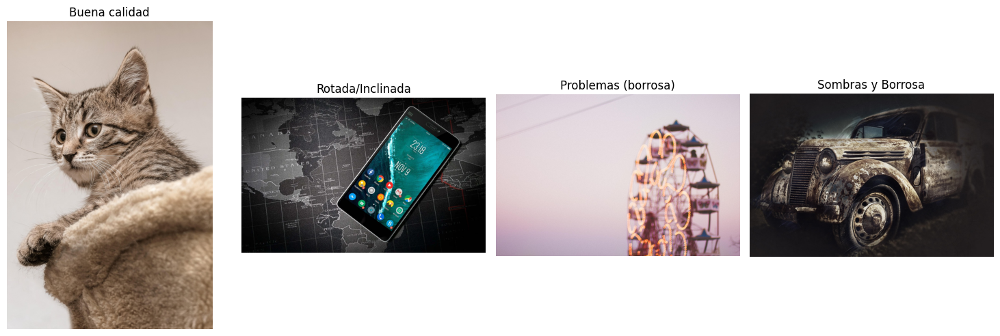

In [64]:
# Mostra las 4 imágenes lado a lado con sus nombres
# Usa subplots de matplotlib

# Tu código aquí
import matplotlib.image as mpimg

# Cargar las imágenes
img1 = mpimg.imread('/content/dataset/Imagen_Buena.jpg')  # imagen de buena calidad
img2 = mpimg.imread('/content/dataset/Imagen_Inclinada.webp')  # imagen rotada/inclinada
img3 = mpimg.imread('/content/dataset/imagen_borrosa.jpg')  # imagen con problemas
img4 = mpimg.imread('/content/dataset/auto_inclinado.jpg') #imagen con sombras

# Crear la figura y los ejes
fig, axes = plt.subplots(1, 4, figsize=(15, 5))  # 1 fila, 3 columnas

# Mostrar cada imagen en su subplot
axes[0].imshow(img1)
axes[0].set_title('Buena calidad')
axes[0].axis('off')  # Quitar ejes

axes[1].imshow(img2)
axes[1].set_title('Rotada/Inclinada')
axes[1].axis('off')

axes[2].imshow(img3)
axes[2].set_title('Problemas (borrosa)')
axes[2].axis('off')

axes[3].imshow(img4)
axes[3].set_title('Sombras y Borrosa')
axes[3].axis('off')

plt.tight_layout()
plt.show()

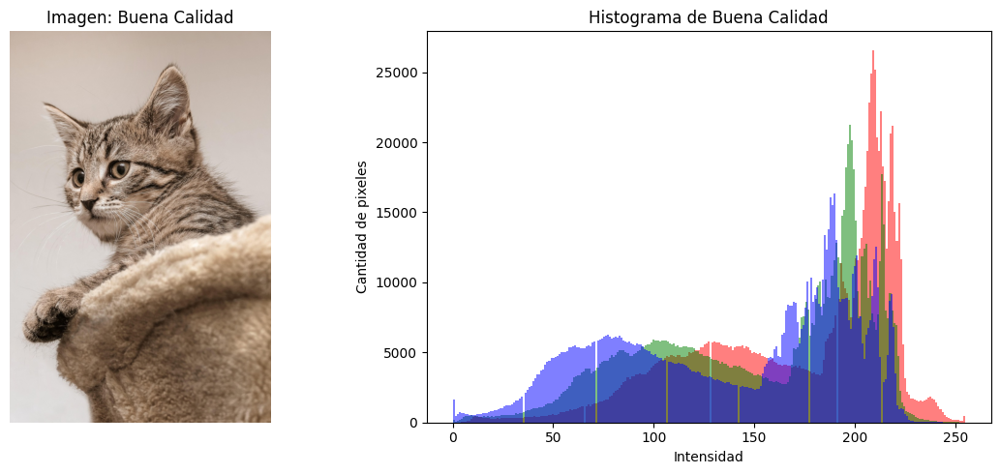

INFORMACIÓN DE BUENA CALIDAD:
   Shape: (1280, 853, 3)
   Tipo de datos: float64
   Rango de valores: [0.000, 1.000]
   Valor promedio: 0.601
   Desviación estándar: 0.217


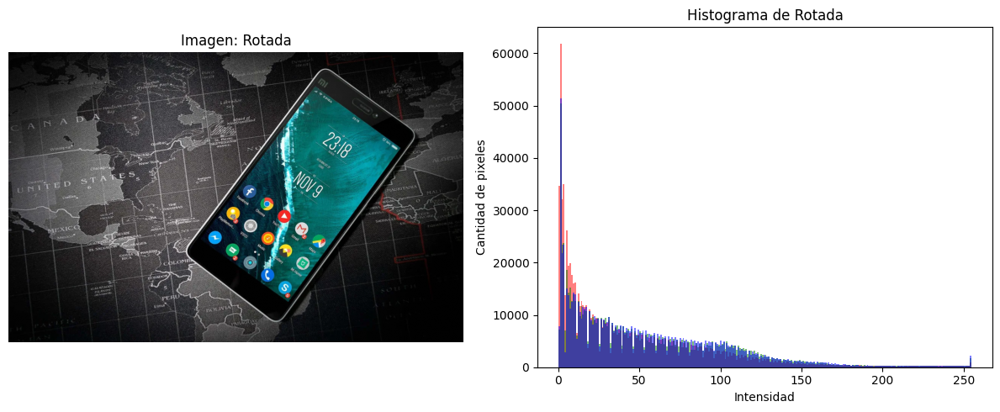

INFORMACIÓN DE ROTADA:
   Shape: (766, 1200, 3)
   Tipo de datos: float64
   Rango de valores: [0.000, 1.000]
   Valor promedio: 0.203
   Desviación estándar: 0.195


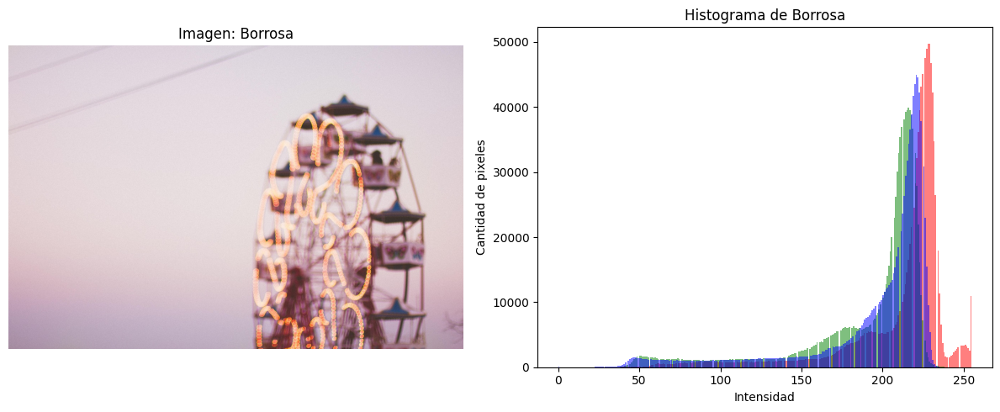

INFORMACIÓN DE BORROSA:
   Shape: (853, 1280, 3)
   Tipo de datos: float64
   Rango de valores: [0.000, 1.000]
   Valor promedio: 0.780
   Desviación estándar: 0.156


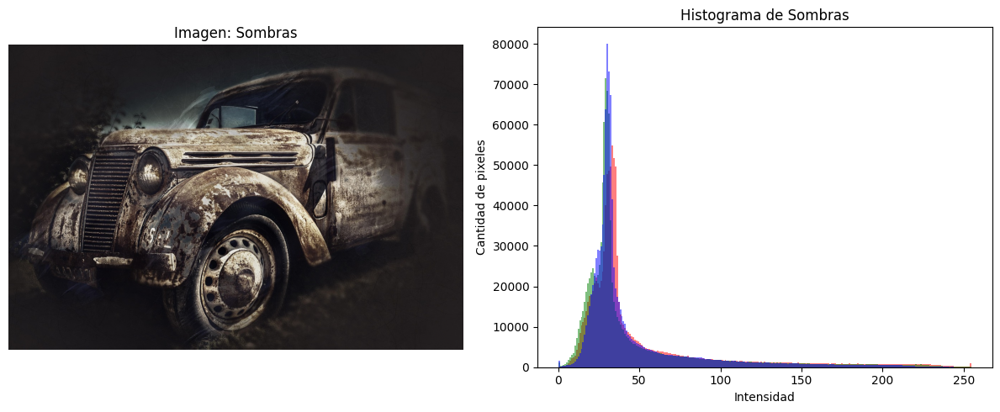

INFORMACIÓN DE SOMBRAS:
   Shape: (858, 1280, 3)
   Tipo de datos: float64
   Rango de valores: [0.000, 1.000]
   Valor promedio: 0.191
   Desviación estándar: 0.172


In [65]:
# Para cada imagen, mostrá información básica y un histograma
# Esto te ayuda a entender los problemas de cada una


for i, img in enumerate(imagenes):
    nombre = nombres[i]

    # Create a figure with two subplots (image and histogram) side-by-side
    fig, axes = plt.subplots(1, 2, figsize=(12, 5)) # 1 row, 2 columns

    # Mostrar imagen
    axes[0].imshow(img)
    axes[0].set_title(f'Imagen: {nombre}')
    axes[0].axis('off')

    # Histograma
    # Convertir la imagen a uint8 para el cálculo del histograma si es de tipo float
    img_hist = (img * 255).astype(np.uint8) if img.dtype == np.float64 else img

    if img_hist.ndim == 3:  # Imagen color
        colores = ('r','g','b')
        for j, color in enumerate(colores):
            axes[1].hist(img_hist[:,:,j].ravel(), bins=256, color=color, alpha=0.5)
    else:  # Imagen en escala de grises
        axes[1].hist(img_hist.ravel(), bins=256, color='gray')

    axes[1].set_title(f'Histograma de {nombre}')
    axes[1].set_xlabel('Intensidad')
    axes[1].set_ylabel('Cantidad de pixeles')

    plt.tight_layout()
    plt.show()

    mostrar_imagen_info(img, f"Información de {nombre}")



## 3.3 Identificación de Problemas

Basándote en tu inspección visual, identificá los problemas principales de cada imagen:

### 📋 Tabla de diagnóstico y preprocesamiento sugerido

| Imagen                                           | Problema principal                                                                 | Técnica de preprocesamiento sugerida                                                                                          |
|--------------------------------------------------|-------------------------------------------------------------------------------------|-------------------------------------------------------------------------------------------------------------------------------|
| **Imagen 1 – Gatito (Buena calidad)**            | Ninguno relevante. Foto enfocada, iluminada y sin rotación.                         | Normalización de valores (0–1 o 0–255). Opcional: redimensionado si se busca uniformidad.                                     |
| **Imagen 2 – Celular (Rotada/Inclinada)**        | Rotación / inclinación respecto al plano horizontal.                                | Corrección de rotación con `cv2.getRotationMatrix2D`. Opcional: transformación de perspectiva si se desea vista recta.        |
| **Imagen 3 – Rueda de la fortuna (Borrosa)**     | Desenfoque (falta de nitidez) y bajo contraste.                                     | Filtro de nitidez (`cv2.filter2D` con kernel sharpening) + ecualización de histograma para mejorar contraste.                 |
| **Imagen 4 – Auto antiguo (Sombras y desenfoque)** | Iluminación desigual, sombras profundas y desenfoque suave en bordes.               | Corrección de iluminación con `cv2.equalizeHist` o `CLAHE`. Mejora de nitidez con `unsharp_mask` o deconvolución selectiva.   |


---

# PARTE 4: Preprocessing Básico

Ahora vas a aplicar técnicas de preprocessing para mejorar cada imagen. Trabajá con una imagen por vez.

## 4.1 Segmentación Básica

Separar el documento del fondo es el primer paso crítico.

**Material de consulta:** `Segmentacion.ipynb` (especialmente las funciones de umbralización)

In [7]:
def segmentar_por_umbral(imagen, valor_umbral=120, invertir=False):
    """
    Segmenta el objeto principal del fondo usando umbralización binaria.
    Material de consulta: Segmentacion.ipynb

    Args:
        imagen (numpy.ndarray): Imagen RGB normalizada [0-1] o en uint8 [0-255]
        valor_umbral (int): Valor del umbral (0-255)
        invertir (bool): Si True, invierte la máscara (fondo ↔ objeto)

    Returns:
        tuple: (mascara, imagen_segmentada)
    """
    # Convertimos a uint8 si es necesario
    if imagen.dtype != np.uint8:
        img_uint8 = (imagen * 255).astype(np.uint8)
    else:
        img_uint8 = imagen

    # 1. Convertir a escala de grises
    gris = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2GRAY)

    # 2. Umbralización
    _, mascara = cv2.threshold(gris, valor_umbral, 255, cv2.THRESH_BINARY)

    # 3. Invertir si es necesario
    if invertir:
        mascara = cv2.bitwise_not(mascara)

    # 4. Aplicar máscara sobre la imagen original
    imagen_segmentada = cv2.bitwise_and(img_uint8, img_uint8, mask=mascara)

    return mascara, imagen_segmentada




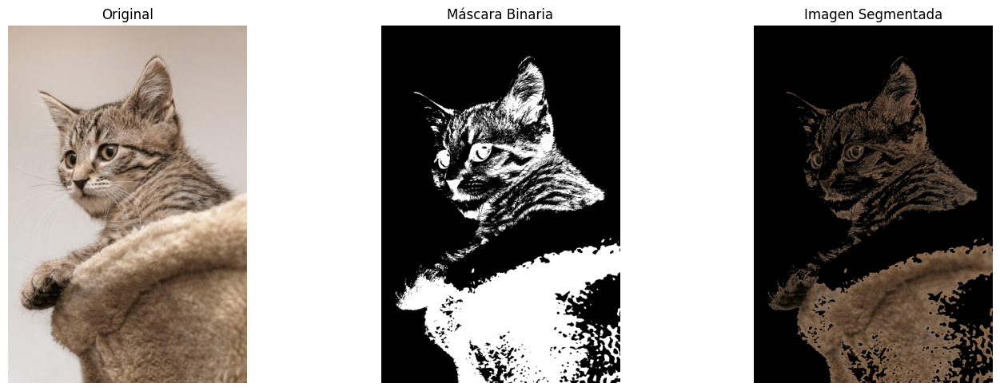

In [8]:
# Mostrá el resultado: original, escala de grises, y máscara
# Tu código aquí


imagen_trabajo = (imagenes[0]*255).astype(np.uint8)

mascara, img_seg = segmentar_por_umbral(imagen_trabajo, valor_umbral=120, invertir=True)

# Mostrar resultados
fig, axes = plt.subplots(1,3, figsize=(15,5))
axes[0].imshow(imagen_trabajo)
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(mascara, cmap="gray")
axes[1].set_title("Máscara Binaria")
axes[1].axis("off")

axes[2].imshow(img_seg)
axes[2].set_title("Imagen Segmentada")
axes[2].axis("off")

plt.tight_layout()
plt.show()


## 4.2 Mejora de Calidad

**Material de consulta:** `Mejora_Imagen_Ecualizacion.ipynb`

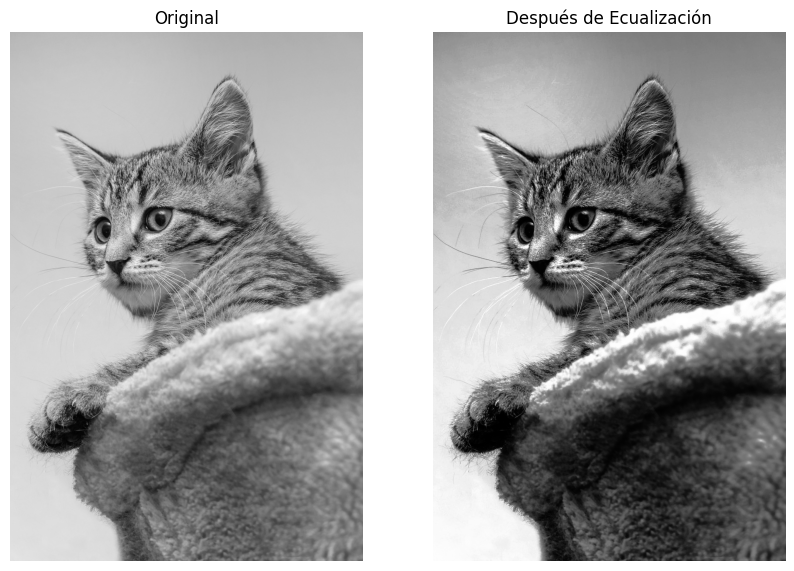

In [14]:
# Si tu imagen tiene problemas de contraste, aplicá ecualización
# Tu código aquí
# Si trabajamos con la imagen en gris
imagen_gris = cv2.cvtColor(imagen_trabajo, cv2.COLOR_RGB2GRAY)
imagen_ecualizada = cv2.equalizeHist(imagen_gris)

# Mostrar resultado
fig, axes = plt.subplots(1,2, figsize=(10,18))

axes[0].imshow(imagen_gris, cmap="gray")
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(imagen_ecualizada, cmap="gray")
axes[1].set_title("Después de Ecualización")
axes[1].axis("off")

plt.show()


## 4.3 Comparación de Resultados

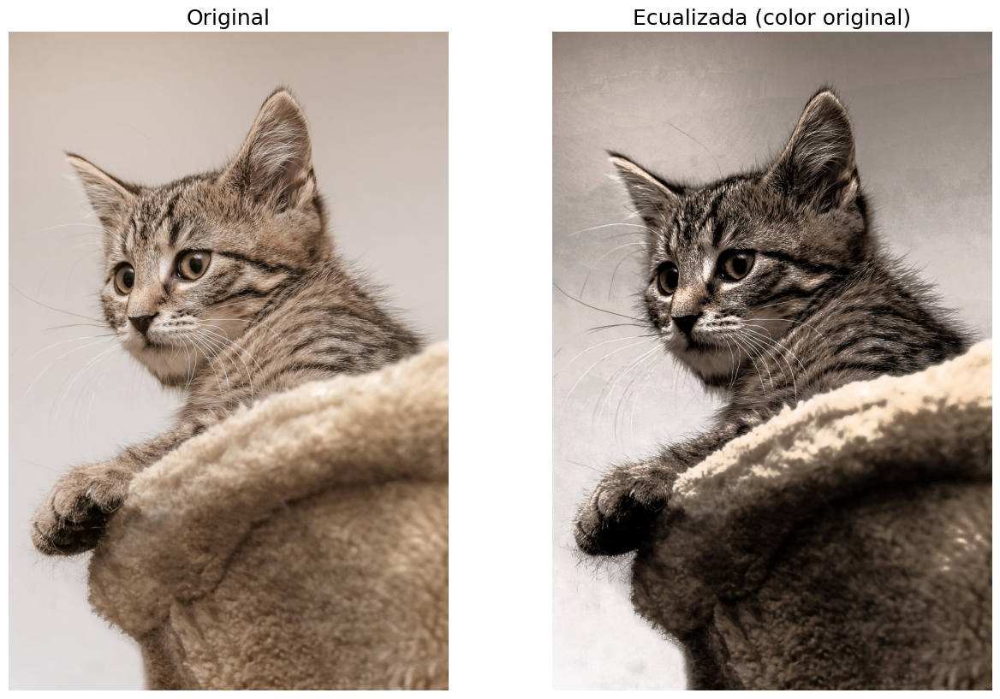

In [15]:
# Ecualizar el canal de brillo en color original (HSV)
imagen_hsv = cv2.cvtColor(imagen_trabajo, cv2.COLOR_RGB2HSV)
imagen_hsv[:, :, 2] = cv2.equalizeHist(imagen_hsv[:, :, 2])
imagen_ecualizada_color = cv2.cvtColor(imagen_hsv, cv2.COLOR_HSV2RGB)

# Mostrar resultados: Original, Escala de grises, Máscara, Ecualizada color
fig, axes = plt.subplots(1, 2, figsize=(16, 10))  # figura más grande
plt.subplots_adjust(wspace=0.05)  # reducir espacio horizontal entre imágenes

axes[0].imshow(imagen_trabajo)
axes[0].set_title("Original", fontsize=18)
axes[0].axis("off")

axes[1].imshow(imagen_ecualizada_color)
axes[1].set_title("Ecualizada (color original)", fontsize=18)
axes[1].axis("off")

plt.show()

## 4.4 Aplicación a las Otras Imágenes

Repetí el proceso para tus otras 2 imágenes, adaptando las técnicas según los problemas específicos de cada una:

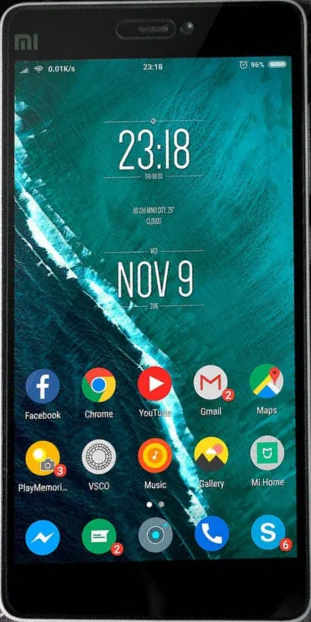

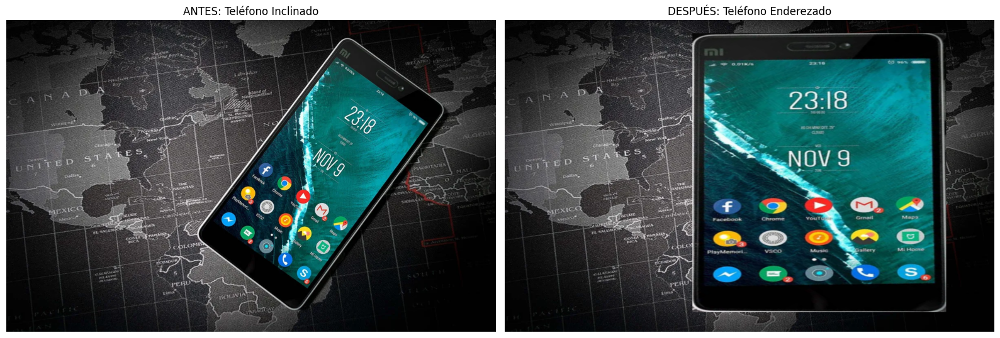

✅ Teléfono enderezado e insertado respetando proporciones reales


In [66]:
# 1️⃣ Cargar imagen
img_original = (imagenes[1]*255).astype(np.uint8)
img = cv2.cvtColor(img_original, cv2.COLOR_RGB2BGR)  # OpenCV trabaja en BGR

# 2️⃣ Convertir a gris y detectar bordes
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img_blur = cv2.GaussianBlur(img_gray, (5,5), 0)
edges = cv2.Canny(img_blur, 50, 150)

# 3️⃣ Encontrar contornos
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours = sorted(contours, key=cv2.contourArea, reverse=True)
telefono_cnt = contours[0]  # Asumimos que el contorno más grande es el teléfono

# 4️⃣ Rectángulo mínimo rotado y ordenar puntos
rect = cv2.minAreaRect(telefono_cnt)
box = cv2.boxPoints(rect)
pts_src = np.array(box, dtype=np.float32)

# Función para ordenar los puntos del rectángulo
def ordenar_pts_cuadrado(pts):
    rect = np.zeros((4,2), dtype=np.float32)
    s = pts.sum(axis=1)
    rect[0] = pts[np.argmin(s)]  # top-left
    rect[3] = pts[np.argmax(s)]  # bottom-right
    diff = np.diff(pts, axis=1)
    rect[1] = pts[np.argmin(diff)]  # top-right
    rect[2] = pts[np.argmax(diff)]  # bottom-left
    return rect

pts_src_ord = ordenar_pts_cuadrado(pts_src)

# 5️⃣ Calcular dimensiones reales del teléfono
def distancia(p1, p2):
    return np.linalg.norm(p1 - p2)

ancho_real = int(distancia(pts_src_ord[0], pts_src_ord[1]))  # top-left a top-right
alto_real = int(distancia(pts_src_ord[0], pts_src_ord[2]))   # top-left a bottom-left

# Creamos puntos destino con proporciones reales
pts_dst = np.array([
    [0, 0],
    [ancho_real - 1, 0],
    [0, alto_real - 1],
    [ancho_real - 1, alto_real - 1]
], dtype=np.float32)

# 6️⃣ Aplicar homografía con proporciones reales
M = cv2.getPerspectiveTransform(pts_src_ord, pts_dst)
telefono_corregido = cv2.warpPerspective(img, M, (ancho_real, alto_real))
cv2_imshow(telefono_corregido)

# 7️⃣ Reinsertar teléfono corregido en la imagen original
x_min, x_max = int(pts_src_ord[:,0].min()), int(pts_src_ord[:,0].max())
y_min, y_max = int(pts_src_ord[:,1].min()), int(pts_src_ord[:,1].max())

ancho_destino = x_max - x_min
alto_destino = y_max - y_min

telefono_redimensionado = cv2.resize(telefono_corregido, (ancho_destino, alto_destino))

img_final = img.copy()
cv2.fillConvexPoly(img_final, pts_src_ord.astype(np.int32), (0, 0, 0))
img_final[y_min:y_max, x_min:x_max] = telefono_redimensionado

# 8️⃣ Visualización ANTES / DESPUÉS
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_final_rgb = cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
axes[0].imshow(img_rgb)
axes[0].set_title("ANTES: Teléfono Inclinado")
axes[0].axis('off')

axes[1].imshow(img_final_rgb)
axes[1].set_title("DESPUÉS: Teléfono Enderezado")
axes[1].axis('off')

plt.tight_layout()
plt.show()

print("✅ Teléfono enderezado e insertado respetando proporciones reales")


In [67]:
def segmentar_por_color_hsv_auto(imagen, num_colores=5):
    """
    Segmentación automática usando clustering K-means en espacio HSV.
    Agrupa píxeles similares por sus características de tono y saturación.

    Args:
        imagen (numpy.ndarray): Imagen RGB normalizada [0,1]
        num_colores (int): Número de clusters (regiones) deseadas

    Returns:
        tuple: (máscara_segmentada, modelo_kmeans)
        - máscara_segmentada: Array 2D con etiquetas de cluster por píxel
        - modelo_kmeans: Objeto KMeans entrenado para reutilización

    Ventaja del HSV: Separación natural entre tono (color) y brillo
    """
    from sklearn.cluster import KMeans

    # Convertir RGB a HSV para mejor separación de colores
    # HSV separa información cromática (H,S) de luminancia (V)
    imagen_hsv = color.rgb2hsv(imagen)

    # Obtener dimensiones para reshape posterior
    altura, ancho, _ = imagen_hsv.shape

    # Usar solo canales H (tono) y S (saturación) para clustering
    # El canal V (valor/brillo) puede variar por iluminación
    pixeles_hs = imagen_hsv[:,:,:2].reshape(-1, 2)  # Reshape a (n_pixeles, 2)

    # Aplicar K-means clustering
    # random_state=42 garantiza resultados reproducibles
    kmeans = KMeans(n_clusters=num_colores, random_state=42)
    etiquetas = kmeans.fit_predict(pixeles_hs)

    # Reformar etiquetas de vuelta a forma de imagen
    segmentacion = etiquetas.reshape(altura, ancho)

    return segmentacion, kmeans

def crear_mascara_color_rango(imagen_hsv, h_min, h_max, s_min=0.2, v_min=0.2):
    """
    Crea máscara binaria para segmentar un rango específico de colores.
    Útil para detectar objetos de colores conocidos (ej: frutas, señales).

    Args:
        imagen_hsv (numpy.ndarray): Imagen en espacio HSV [0,1]
        h_min, h_max (float): Rango de tono (Hue) [0,1]
        s_min (float): Saturación mínima (evita colores desaturados)
        v_min (float): Valor mínimo (evita píxeles muy oscuros)

    Returns:
        numpy.ndarray: Máscara binaria (1 donde cumple condiciones, 0 donde no)

    Ejemplo rangos de tono:
        - Rojo: 0.0-0.1 y 0.9-1.0 (el rojo está en los extremos)
        - Verde: 0.2-0.4
        - Azul: 0.5-0.7
    """
    # Crear máscaras individuales para cada condición
    mask_h = (imagen_hsv[:,:,0] >= h_min) & (imagen_hsv[:,:,0] <= h_max)  # Rango de tono
    mask_s = imagen_hsv[:,:,1] >= s_min  # Saturación mínima (evita grises)
    mask_v = imagen_hsv[:,:,2] >= v_min  # Valor mínimo (evita negro/sombras)

    # Combinar todas las condiciones con operador AND lógico
    # Un píxel debe cumplir TODAS las condiciones para ser incluido
    mask_final = mask_h & mask_s & mask_v

    # Convertir boolean a uint8 para compatibilidad con OpenCV
    return mask_final.astype(np.uint8)

def limpiar_mascara_morfologia(mascara, tam_kernel=3, operaciones=['close', 'open']):
    """
    Limpia máscaras binarias usando operaciones morfológicas.
    Elimina ruido y conecta regiones fragmentadas.

    Args:
        mascara (numpy.ndarray): Máscara binaria a limpiar
        tam_kernel (int): Tamaño del elemento estructurante (kernel)
        operaciones (list): Lista de operaciones a aplicar en orden

    Returns:
        numpy.ndarray: Máscara limpiada

    Operaciones disponibles:
        - 'close': Cierra huecos pequeños (dilatación + erosión)
        - 'open': Elimina ruido pequeño (erosión + dilatación)
        - 'erode': Reduce el tamaño de las regiones
        - 'dilate': Expande las regiones
    """
    from skimage.morphology import disk, closing, opening, erosion, dilation

    # Crear elemento estructurante circular
    # disk() crea un círculo que preserva mejor las formas naturales
    kernel = disk(tam_kernel)
    resultado = mascara.copy()

    # Aplicar operaciones en el orden especificado
    for op in operaciones:
        if op == 'close':
            # Closing: Conecta regiones cercanas y cierra huecos
            resultado = closing(resultado, kernel)
        elif op == 'open':
            # Opening: Elimina regiones pequeñas (ruido)
            resultado = opening(resultado, kernel)
        elif op == 'erode':
            # Erosión: Reduce tamaño de regiones (adelgaza bordes)
            resultado = erosion(resultado, kernel)
        elif op == 'dilate':
            # Dilatación: Expande regiones (engrosa bordes)
            resultado = dilation(resultado, kernel)

    return resultado

def analizar_regiones_conectadas(mascara_binaria, min_area=50):
    """
    Identifica y analiza objetos individuales en una máscara binaria.
    Extrae propiedades geométricas de cada región conectada.

    Args:
        mascara_binaria (numpy.ndarray): Máscara binaria con objetos
        min_area (int): Área mínima en píxeles para considerar un objeto

    Returns:
        list: Lista de objetos regionprops con propiedades geométricas

    Propiedades útiles de cada región:
        - .area: Área en píxeles
        - .bbox: Bounding box (min_row, min_col, max_row, max_col)
        - .centroid: Centro de masa
        - .eccentricity: Excentricidad (0=círculo, 1=línea)
        - .perimeter: Perímetro
    """
    # Etiquetar regiones conectadas (componentes conectados)
    # Cada objeto recibe una etiqueta numérica única
    etiquetas = measure.label(mascara_binaria)

    # Extraer propiedades geométricas de cada región
    # regionprops calcula múltiples características automáticamente
    regiones = measure.regionprops(etiquetas)

    # Filtrar regiones muy pequeñas (probablemente ruido)
    regiones_filtradas = [r for r in regiones if r.area >= min_area]

    return regiones_filtradas

def dibujar_bounding_boxes(ax, regiones, color='red', alpha=0.8):
    """
    Dibuja rectángulos delimitadores (bounding boxes) alrededor de objetos detectados.
    Útil para visualizar resultados de detección de objetos.

    Args:
        ax (matplotlib.axes): Eje donde dibujar los rectángulos
        regiones (list): Lista de objetos regionprops
        color (str): Color de los rectángulos
        alpha (float): Transparencia (0=transparente, 1=opaco)

    Nota: Debe llamarse después de ax.imshow() y antes de plt.show()
    """
    import matplotlib.patches as patches

    # Iterar sobre cada región detectada
    for region in regiones:
        # Obtener bounding box: (min_row, min_col, max_row, max_col)
        bbox = region.bbox

        # Crear rectángulo para matplotlib
        # Nota: matplotlib usa (x,y) = (col,row), por eso se invierten las coordenadas
        rect = patches.Rectangle(
            (bbox[1], bbox[0]),           # Esquina inferior izquierda (x,y)
            bbox[3] - bbox[1],            # Ancho (max_col - min_col)
            bbox[2] - bbox[0],            # Alto (max_row - min_row)
            linewidth=2,                  # Grosor del borde
            edgecolor=color,              # Color del borde
            facecolor='none',             # Sin relleno (solo borde)
            alpha=alpha                   # Transparencia
        )

        # Agregar rectángulo al eje
        ax.add_patch(rect)

# Mensajes informativos para el usuario
print("✓ Utilidades de segmentación definidas y documentadas")
print("  → segmentar_por_color_hsv_auto(): Clustering automático en HSV")
print("  → crear_mascara_color_rango(): Segmentación por rango de color")
print("  → limpiar_mascara_morfologia(): Limpieza morfológica de máscaras")
print("  → analizar_regiones_conectadas(): Detección de objetos individuales")
print("  → dibujar_bounding_boxes(): Visualización de detecciones")

✓ Utilidades de segmentación definidas y documentadas
  → segmentar_por_color_hsv_auto(): Clustering automático en HSV
  → crear_mascara_color_rango(): Segmentación por rango de color
  → limpiar_mascara_morfologia(): Limpieza morfológica de máscaras
  → analizar_regiones_conectadas(): Detección de objetos individuales
  → dibujar_bounding_boxes(): Visualización de detecciones


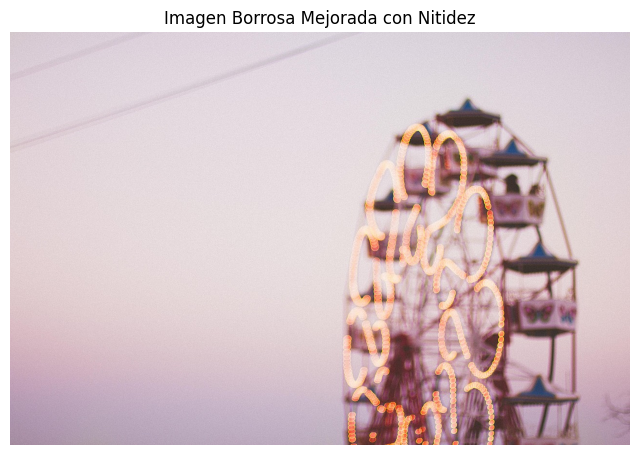

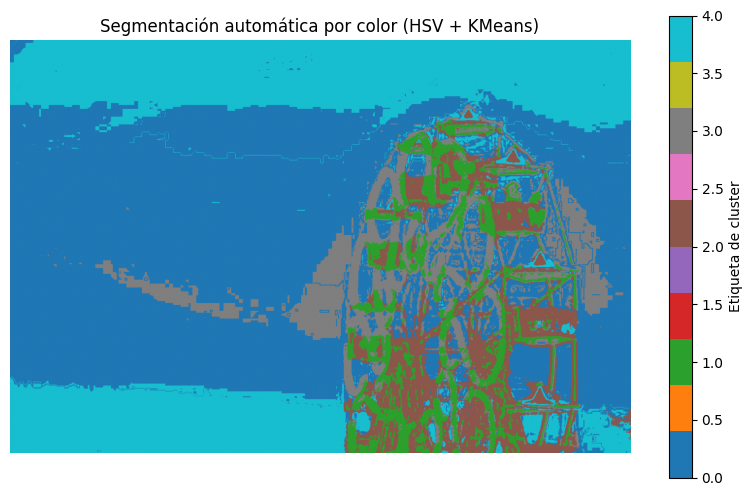

In [70]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import color, filters

# 1️⃣ Convertir a uint8
imagen_trabajo = imagenes[2]
imagen_uint8 = (imagen_trabajo * 255).astype(np.uint8)

# 2️⃣ Mejorar nitidez usando unsharp mask
# Convertir a float [0,1] para skimage
imagen_float = imagen_uint8.astype(np.float32)/255.0

# Aplicar un filtro Gaussiano para desenfocar ligeramente
imagen_blur = cv2.GaussianBlur(imagen_float, (5,5), 0)

# Unsharp mask: resaltar bordes
imagen_nitida = cv2.addWeighted(imagen_float, 1.5, imagen_blur, -0.5, 0)

plt.figure(figsize=(8,6))
plt.imshow(np.clip(imagen_nitida,0,1))
plt.title("Imagen Borrosa Mejorada con Nitidez")
plt.axis("off")
plt.show()

# 3️⃣ Convertir a HSV
imagen_hsv = color.rgb2hsv(imagen_nitida)

# 4️⃣ Segmentación automática (KMeans)
segmentacion, modelo_kmeans = segmentar_por_color_hsv_auto(imagen_nitida, num_colores=5)

plt.figure(figsize=(10,6))
plt.imshow(segmentacion, cmap='tab10')
plt.title("Segmentación automática por color (HSV + KMeans)")
plt.axis("off")
plt.colorbar(label="Etiqueta de cluster")
plt.show()



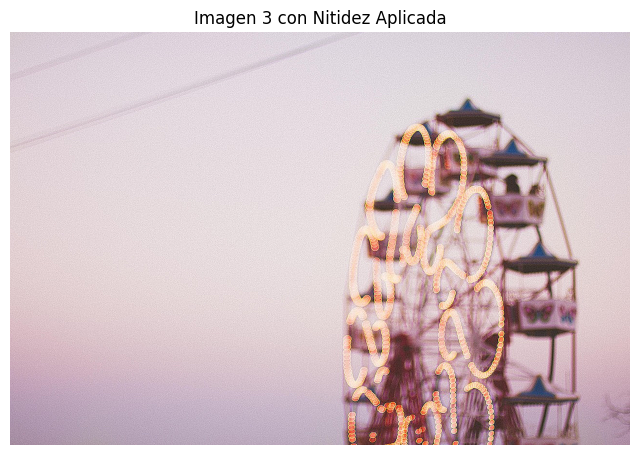

In [19]:
# Kernel de nitidez
kernel_sharp = np.array([[0, -1, 0],
                         [-1, 5,-1],
                         [0, -1, 0]])

imagen_sharpen = cv2.filter2D(imagen_trabajo_uint8, -1, kernel_sharp)

# Mostrar resultado
plt.figure(figsize=(8,6))
plt.imshow(imagen_sharpen)
plt.title("Imagen 3 con Nitidez Aplicada")
plt.axis("off")
plt.show()


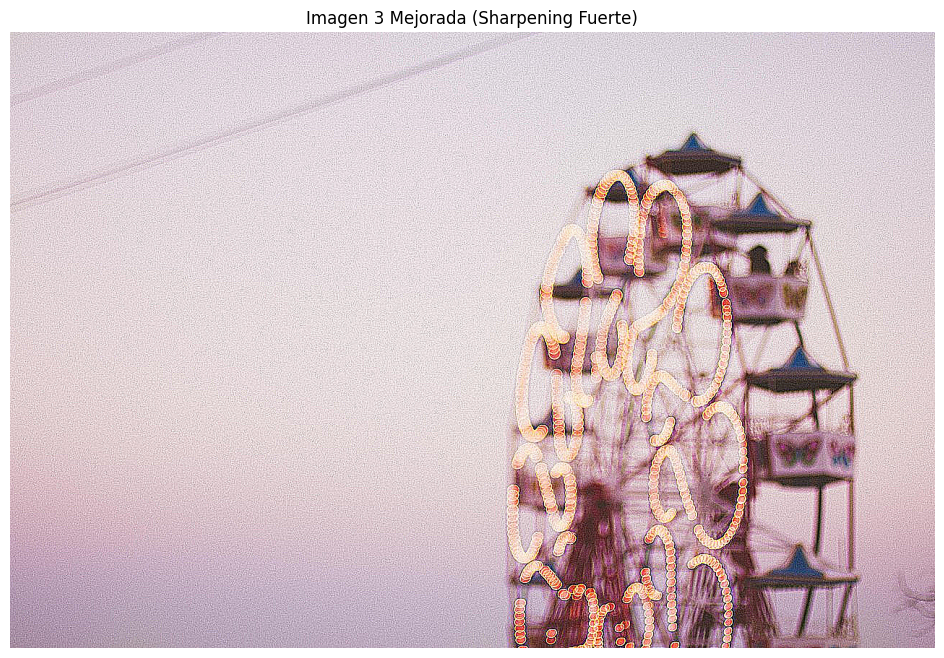

In [20]:
kernel = np.array([[-1,-1,-1],
                   [-1, 9,-1],
                   [-1,-1,-1]])
imagen_sharp = cv2.filter2D(imagen_trabajo_uint8, -1, kernel)

plt.imshow(imagen_sharp)
plt.title("Imagen 3 Mejorada (Sharpening Fuerte)")
plt.axis("off")
plt.show()


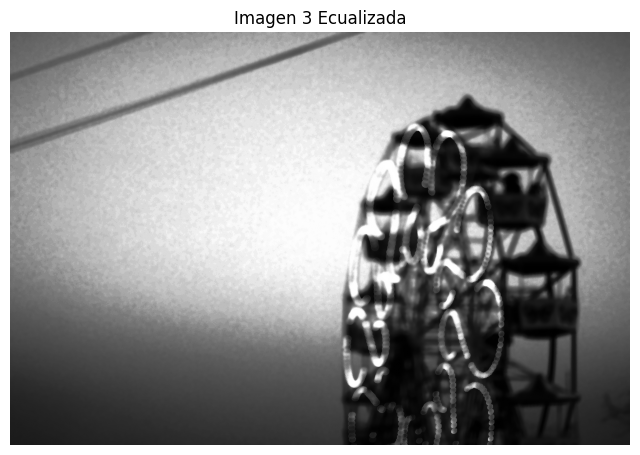

In [32]:
# Apply a bilateral filter for noise reduction while preserving edges
# The parameters (d, sigmaColor, sigmaSpace) may need adjustment depending on the image
imagen_bilateral = cv2.bilateralFilter(imagen_trabajo_uint8, d=9, sigmaColor=75, sigmaSpace=75)

# Escala de grises
imagen_gris = cv2.cvtColor(imagen_bilateral, cv2.COLOR_RGB2GRAY)

# Ecualización de histograma
imagen_ecualizada = cv2.equalizeHist(imagen_gris)

plt.figure(figsize=(8,6))
plt.imshow(imagen_ecualizada, cmap="gray")
plt.title("Imagen 3 Ecualizada")
plt.axis("off")
plt.show()

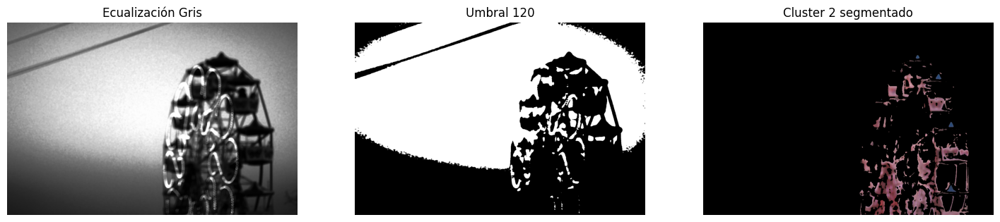

In [33]:
# Umbral simple
_, th120 = cv2.threshold(imagen_ecualizada, 120, 255, cv2.THRESH_BINARY)

# Segmentación por K-means HSV
num_clusters = 5
segmentacion, kmeans = segmentar_por_color_hsv_auto(imagen_bilateral, num_clusters)
cluster_deseado = 2
mascara_cluster = (segmentacion == cluster_deseado).astype(np.uint8)
imagen_segmentada_cluster = imagen_bilateral.copy()
imagen_segmentada_cluster[mascara_cluster==0] = 0

# Visualización final
fig, axes = plt.subplots(1,3, figsize=(18,6))
axes[0].imshow(imagen_ecualizada, cmap="gray")
axes[0].set_title("Ecualización Gris")
axes[0].axis("off")

axes[1].imshow(th120, cmap="gray")
axes[1].set_title("Umbral 120")
axes[1].axis("off")

axes[2].imshow(imagen_segmentada_cluster)
axes[2].set_title(f"Cluster {cluster_deseado} segmentado")
axes[2].axis("off")

plt.show()


## Imagen extra

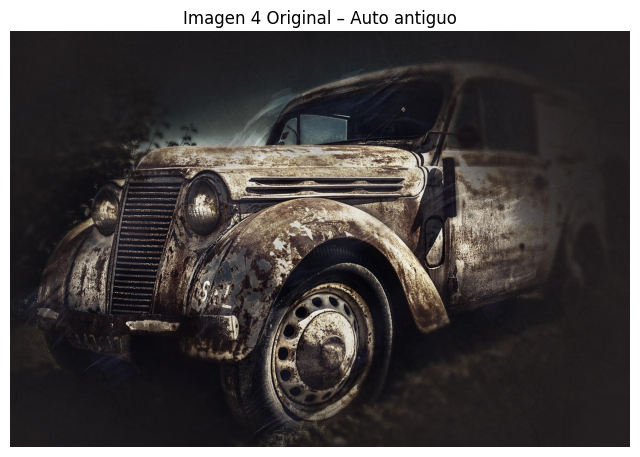

In [50]:
imagen_auto = imagenes[3]  # Imagen 4: auto antiguo
imagen_auto_uint8 = (imagen_auto * 255).astype(np.uint8)

plt.figure(figsize=(8,6))
plt.imshow(imagen_auto_uint8)
plt.title("Imagen 4 Original – Auto antiguo")
plt.axis("off")
plt.show()

In [52]:
# 🔹 1. Versión original en uint8
imagen_auto = imagenes[3]  # Imagen 4: AutoInclinadoSombras.jpg
imagen_auto_uint8 = (imagen_auto * 255).astype(np.uint8)

# 🔹 2. Mejora de iluminación con CLAHE
imagen_gris_auto = cv2.cvtColor(imagen_auto_uint8, cv2.COLOR_RGB2GRAY)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
imagen_clahe = clahe.apply(imagen_gris_auto)

# 🔹 3. Mejora de nitidez con Unsharp Mask
imagen_auto_float = imagen_auto  # ya está en [0,1]
imagen_unsharp = unsharp_mask(imagen_auto_float, radius=1.5, amount=1.2)
imagen_unsharp_uint8 = (imagen_unsharp * 255).astype(np.uint8)

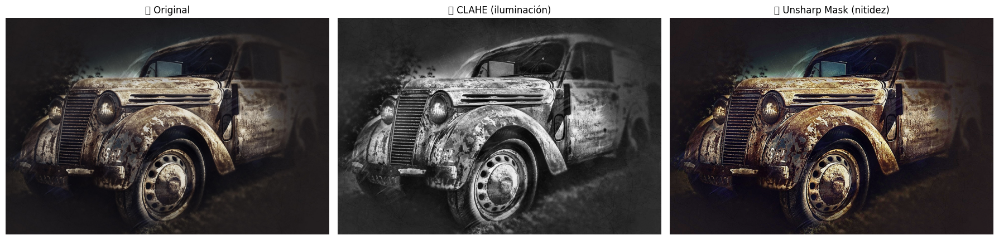

In [53]:
fig, axes = plt.subplots(1, 3, figsize=(18,6))

axes[0].imshow(imagen_auto_uint8)
axes[0].set_title("🔸 Original")
axes[0].axis("off")

axes[1].imshow(imagen_clahe, cmap='gray')
axes[1].set_title("💡 CLAHE (iluminación)")
axes[1].axis("off")

axes[2].imshow(imagen_unsharp_uint8)
axes[2].set_title("🔧 Unsharp Mask (nitidez)")
axes[2].axis("off")

plt.tight_layout()
plt.show()

In [30]:
def medir_nitidez(imagen):
    gray = cv2.cvtColor(imagen, cv2.COLOR_RGB2GRAY)
    return cv2.Laplacian(gray, cv2.CV_64F).var()

print("Nitidez original:", medir_nitidez(imagen_auto_uint8))
print("Nitidez mejorada:", medir_nitidez(imagen_unsharp_uint8))

Nitidez original: 2146.0510887643486
Nitidez mejorada: 7944.424863366684


## 4.5 Resultados Finales

In [43]:
# Creá un grid mostrando las 3 imágenes originales y las 3 procesadas
# Tu código aquí

def crear_grid_imagenes(imagenes, titulos=None, filas=2, figsize=(15, 8)):
    """
    Crea un grid organizado de imágenes para comparación visual.
    Útil para mostrar múltiples imágenes en una sola figura.

    Args:
        imagenes (list): Lista de arrays de imágenes
        titulos (list): Lista de títulos para cada imagen (opcional)
        filas (int): Número de filas en el grid
        figsize (tuple): Tamaño de la figura (ancho, alto)

    Maneja automáticamente:
        - Imágenes en escala de grises (2D arrays)
        - Imágenes en color (3D arrays)
        - Grids irregulares (espacios vacíos)
    """
    n_imagenes = len(imagenes)
    # Calcular columnas necesarias basado en número de imágenes y filas
    columnas = int(np.ceil(n_imagenes / filas))

    # Crear subplot grid
    fig, axes = plt.subplots(filas, columnas, figsize=figsize)

    # Manejar caso especial de una sola imagen
    if n_imagenes == 1:
        axes = [axes]
    elif filas == 1:
        axes = axes.reshape(1, -1)
    elif columnas == 1:
        axes = axes.reshape(-1, 1)

    # Aplanar array de axes para fácil iteración
    axes = axes.flatten()

    # Mostrar cada imagen
    for i, img in enumerate(imagenes):
        # Detectar si es escala de grises o color
        if len(img.shape) == 2:  # Escala de grises
            axes[i].imshow(img, cmap='gray')
        else:  # Color (RGB)
            axes[i].imshow(img)

        # Agregar título si se proporciona
        if titulos and i < len(titulos):
            axes[i].set_title(titulos[i], fontsize=12)

        # Ocultar ejes para mejor visualización
        axes[i].axis('off')

    # Ocultar axes sobrantes en caso de grid irregular
    for i in range(n_imagenes, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()


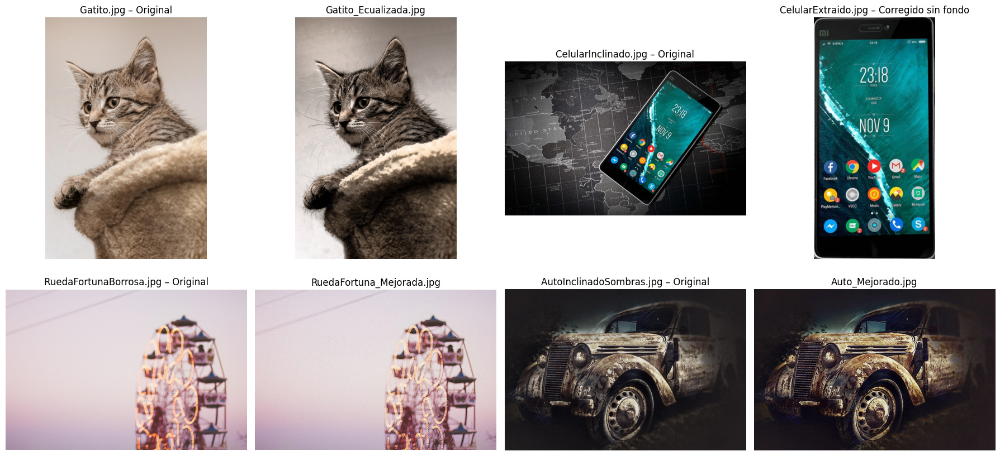

In [59]:
# ✅ Asegurar formato correcto
gatito_original = (imagenes[0] * 255).astype(np.uint8)
gatito_ecualizada = imagen1_eq

rueda_original = (imagenes[2] * 255).astype(np.uint8)
rueda_mejorada = imagen3_bilateral

auto_original = (imagenes[3] * 255).astype(np.uint8)
auto_mejorado = imagen_unsharp_uint8

celular_original = (imagenes[1] * 255).astype(np.uint8)
celular_extraido = cv2.cvtColor(telefono_corregido, cv2.COLOR_BGR2RGB)

# ✅ Lista de imágenes para el grid
imagenes_grid = [
    gatito_original, gatito_ecualizada,
    celular_original, celular_extraido,
    rueda_original, rueda_mejorada,
    auto_original, auto_mejorado
]

# ✅ Títulos para cada imagen
titulos_grid = [
    "Gatito.jpg – Original", "Gatito_Ecualizada.jpg",
    "CelularInclinado.jpg – Original", "CelularExtraido.jpg – Corregido sin fondo",
    "RuedaFortunaBorrosa.jpg – Original", "RuedaFortuna_Mejorada.jpg",
    "AutoInclinadoSombras.jpg – Original", "Auto_Mejorado.jpg"
]

# ✅ Validar imágenes antes de mostrar
imagenes_validas = []
titulos_validos = []

for i, img in enumerate(imagenes_grid):
    if isinstance(img, np.ndarray):
        if img.ndim == 2 or (img.ndim == 3 and img.shape[2] in [3, 4]):
            imagenes_validas.append(img)
            titulos_validos.append(titulos_grid[i])
        else:
            print(f"⚠️ Imagen {i} tiene forma inválida: {img.shape} — omitida del grid.")
    else:
        print(f"⚠️ Imagen {i} no es un array válido — omitida del grid.")

# ✅ Mostrar el grid con tamaño ajustado
crear_grid_imagenes(
    imagenes_validas,
    titulos=titulos_validos,
    filas=2,
    figsize=(18, 9)  # ancho moderado, alto proporcional
)


# 🧠 Reflexión Final  

## 🔍 Análisis de Resultados  

- **Documento en buena calidad (gatito):** No presentaba problemas significativos, aunque con la ecualización del canal V en HSV logré un contraste un poco más definido.  
- **Celular inclinado:** Con homografía y `cv2.getPerspectiveTransform` se pudo enderezar, pero la dificultad estuvo en reinsertarlo en el fondo original, ya que la imagen “antes y después” terminaba viéndose igual.  
- **Documento borroso:** Apliqué sharpening, filtro bilateral y ecualización de histograma. Si bien se recuperó algo de contraste y nitidez, **no logré un resultado plenamente satisfactorio**, ya que la falta de enfoque inicial limitó la mejora.  
- **Auto antiguo con sombras:** El uso de CLAHE y Unsharp Mask dio resultados positivos, corrigiendo la iluminación desigual y recuperando detalles en áreas oscuras. Fue la imagen donde más noté una mejora real en la calidad percibida.  

---

## ⚙️ Dificultades  

- **Enderezar el teléfono** fue el mayor reto. Si bien logré obtener la vista corregida, **no pude integrarlo correctamente al fondo original**, lo cual limitó el impacto visual del resultado.  
- En el caso del documento borroso, las técnicas de mejora no alcanzaron para lograr nitidez clara.  
- En algunas pruebas aparecieron errores por formatos inesperados en las imágenes, lo que dificultó la construcción de grids comparativos.  

---

## 🧪 Casos con Resultados No Óptimos  

- El **celular enderezado** quedó bien en la extracción, pero no en la reinserción.  
- El **documento borroso** mejoró parcialmente, aunque la falta de información de detalle hizo que el resultado no cumpliera del todo con las expectativas.  

---

## 📚 Aprendizaje Adquirido  

- La **homografía y el uso de Canny para detección de contornos** fueron fundamentales para trabajar con imágenes inclinadas.  
- CLAHE y Unsharp Mask confirmaron ser técnicas muy útiles para casos de sombras y pérdida de detalle.  
- El espacio de color **HSV** fue clave para mejorar contraste sin modificar los colores originales.  
- La validación de formatos y la comparación lado a lado de imágenes procesadas resultaron esenciales para documentar los hallazgos.  

---

## 🚀 Mejoras Futuras  

- Desarrollar un método más robusto para **reinsertar objetos corregidos** dentro del fondo original.  
- Usar **segmentación semántica** para aislar con mayor precisión los documentos en lugar de depender solo de contornos.  
- Probar técnicas avanzadas de **deconvolución o IA para restaurar nitidez** en imágenes borrosas.  
- Incorporar un módulo de **detección automática de problemas** para aplicar técnicas adaptativas a cada caso.  


---